In [4]:
from osgeo import gdal, gdal_array
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import os
import pandas as pd
import cv2
import sys

In [5]:
# import python file containining constants for all folder and file paths.
sys.path.insert(0, '../')
import data_paths as dp

D:\wildfire-sumatera-dataset already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2 already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\landsat-8 already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\sentinel-2 already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8 already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\landsat-8\prefire already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\landsat-8\postfire already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\prefire already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire already exist


In [6]:
# function for plotting band's value
def plot_bands(dictionary):
    for key, val in dictionary.items():
        plt.figure(figsize=(15,10))
        plt.title(key)
        sns.histplot(val.reshape(-1), bins=256)
        plt.show()

# 1. Creating Functions
This steps involve creating function that will be frequently used throughout the notebook.

In [8]:
def display_image(img, figsize=(15, 10), title="", cmap=None):
    """
    Function to show an image of band(s) of image satellite.
    img = received an array of floats containing value (pixels) of band(s)
    size  = receive a tuple (width, height) for the size of image being showned
    title = received a string for title of the image
    """
    plt.figure(figsize=figsize)
    plt.title(title)
    plt.imshow(img, cmap=cmap)
    plt.show()

In [9]:

def get_img_as_array(filepath, dictionary):
    """
    This functions is used to open a .tiff files inside the file path and return it as a dictionary which consists of:
    1. key = band name
    2. value = array of floats which represent the value of satellite image band
    """
    os.chdir(filepath)
    print(filepath)
    band_imgs = {}
    for key, val in dictionary.items():
        # open the .tiff file
        if os.path.exists(filepath):
            tiff_file = gdal.Open(key)
            bands = key.split('_')
            for i, band in enumerate(bands):
                band_imgs[band] = tiff_file.GetRasterBand(i+1).ReadAsArray()
    
    return band_imgs

In [10]:
def get_all_imgs_as_array(filepaths, dictionary):
    """
    this function is used to return array of dictionaries
    """
    
    arr = []
#     os.chdir(folder_path)
    
    for filepath in filepaths:
        arr.append(get_img_as_array(filepath, dictionary))
    return arr

In [11]:
def convert_to_jpeg(bands=[], file_path=""):
    """
    This function is used to convert three channel numpy arrays into a jpeg format
    which the bands must be input reverse.
    """
    if not bands:
        print("bands cannot be empty")
        return 
    
    if not file_path:
        print("filename cannot be empty")
        return
    img = cv2.merge(bands)
    cv2.imwrite(file_path, img*256)
    return True

# 2. Creating Dataframe (Metadata) for Landsat Images
Include:
1. folder_paths = use to store all folder paths
2. class = use to determine the label of the image
3. mean_dnbr = stores mean of pixels in delta normalized burned ratio. 
4. median_dnbr = stores median of pixels in delta normalized burned ratio.

In [19]:
# getting list of folder paths
landsat_dictionary = {
    'folder_paths_geotiff' : [],
    'class' : [],
    'mean_dnbr' : [],
    'median_dnbr' : [],
}
landsat_dictionary['folder_paths'] = os.listdir(dp.LANDSAT_8_POSTFIRE_GEOTIFF_FOLDER_PATH)
# sort using key = int to convert data to int first before sorting
landsat_dictionary['folder_paths'].sort(key=int)

# adding a folder path of its parent 
landsat_dictionary['folder_paths'] = [dp.LANDSAT_8_POSTFIRE_GEOTIFF_FOLDER_PATH + "\\" + folder_name 
                                      for folder_name in landsat_dictionary['folder_paths']] 
landsat_dictionary

{'folder_paths_geotiff': [],
 'class': [],
 'mean_dnbr': [],
 'median_dnbr': [],
 'folder_paths': ['D:\\wildfire-sumatera-dataset\\wildfire-sumatera-geotiff\\landsat-8\\postfire\\0',
  'D:\\wildfire-sumatera-dataset\\wildfire-sumatera-geotiff\\landsat-8\\postfire\\1',
  'D:\\wildfire-sumatera-dataset\\wildfire-sumatera-geotiff\\landsat-8\\postfire\\2',
  'D:\\wildfire-sumatera-dataset\\wildfire-sumatera-geotiff\\landsat-8\\postfire\\3',
  'D:\\wildfire-sumatera-dataset\\wildfire-sumatera-geotiff\\landsat-8\\postfire\\4',
  'D:\\wildfire-sumatera-dataset\\wildfire-sumatera-geotiff\\landsat-8\\postfire\\5',
  'D:\\wildfire-sumatera-dataset\\wildfire-sumatera-geotiff\\landsat-8\\postfire\\6',
  'D:\\wildfire-sumatera-dataset\\wildfire-sumatera-geotiff\\landsat-8\\postfire\\7',
  'D:\\wildfire-sumatera-dataset\\wildfire-sumatera-geotiff\\landsat-8\\postfire\\8',
  'D:\\wildfire-sumatera-dataset\\wildfire-sumatera-geotiff\\landsat-8\\postfire\\9',
  'D:\\wildfire-sumatera-dataset\\wildfire-

In [21]:
# getting statistics median, mean
landsat_dictionary['mean_dnbr'] = []
landsat_dictionary['median_dnbr'] = []

# set up landsat_postfire_dict for accessing the folder
landsat_postfire_dict = {
    'dnbr_b7': 2,
    'b5_b4': 2,
    'b3_b2': 2
}

for folder in landsat_dictionary['folder_paths']:
    img_band = get_img_as_array(folder, landsat_postfire_dict)
    
    # find mean of dnbr only value above 0
    try:
        temp = img_band['dnbr']
        temp = np.where(temp>0, temp, np.nan)
        landsat_dictionary['mean_dnbr'].append(np.nanmean(temp))
        landsat_dictionary['median_dnbr'].append(np.nanmedian(temp))
        print(len(sentinel_dictionary['mean_dnbr']))
        print(len(sentinel_dictionary['median_dnbr']))
    except:
        landsat_dictionary['mean_dnbr'].append(np.nan)
        landsat_dictionary['median_dnbr'].append(np.nan)
        print("there's some error occured")


## Export to .csv
Export to .csv immediately because the time it took to compute mean and median nbr is quite long. 

In [104]:
# convert to pandas DataFrame and export as .csv file
# landsat_8_df = pd.DataFrame(landsat_dictionary)
# landsat_8_df.to_csv(dp.METADATA_LANDSAT_8_FILE_PATH, index=False)

In [22]:
# landsat_metadata.drop(columns=['class'], inplace=True)

# 3. Take a Look at Landsat Images

In [26]:
landsat_metadata = pd.read_csv(dp.METADATA_LANDSAT_8_FILE_PATH)
FACTOR=2
# dictionaty for reading the file in each folder
landsat_postfire_dict = {
    'dnbr_b7': 2,
    'b5_b4': 2,
    'b3_b2': 2
}

## Landsat-8 Postfire Images

D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\landsat-8\postfire\5624


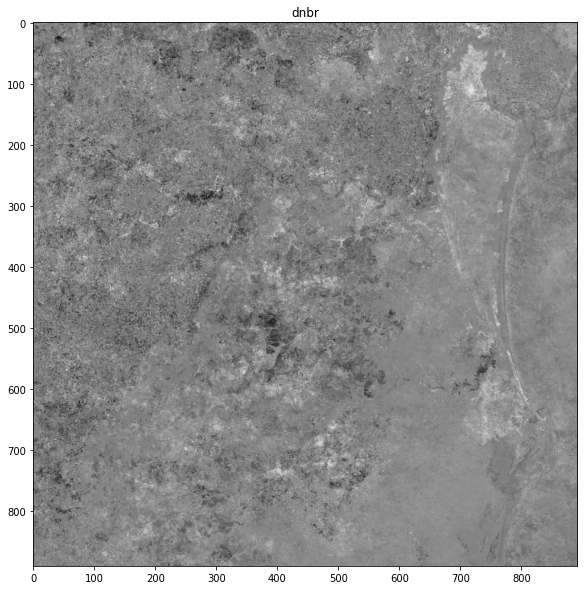

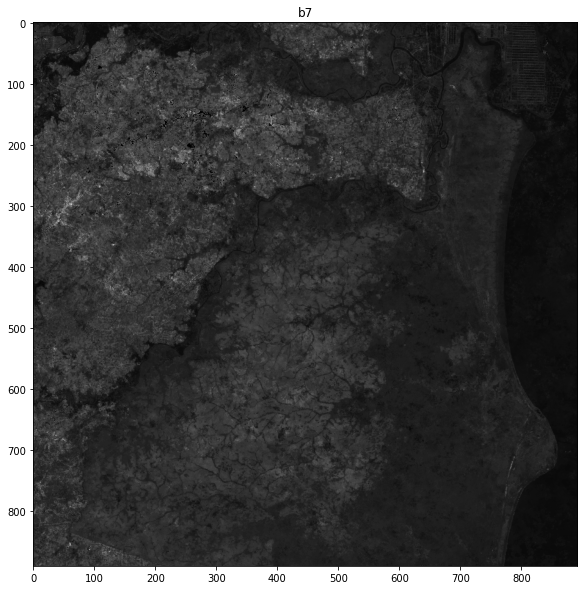

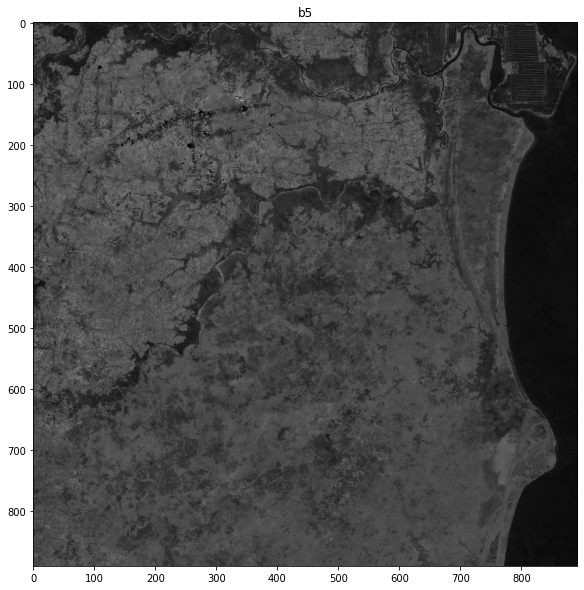

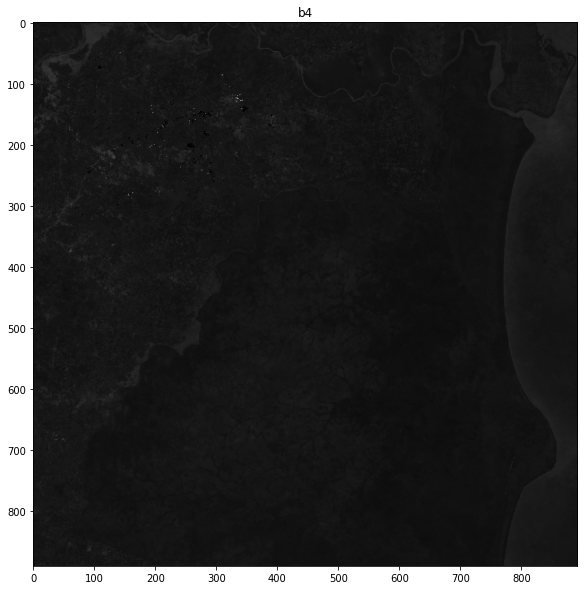

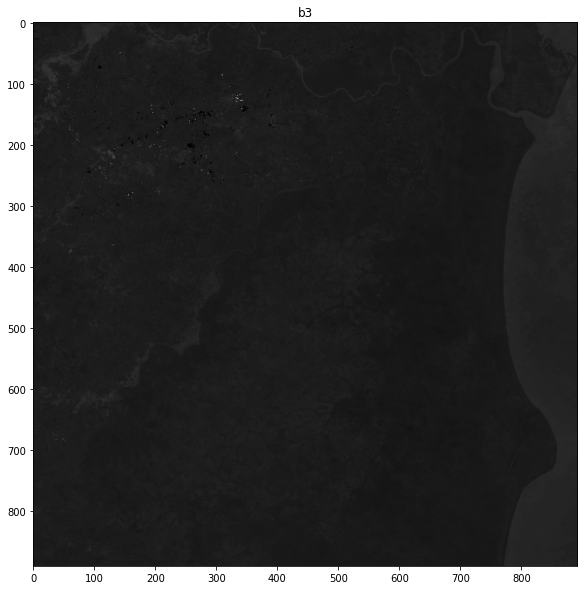

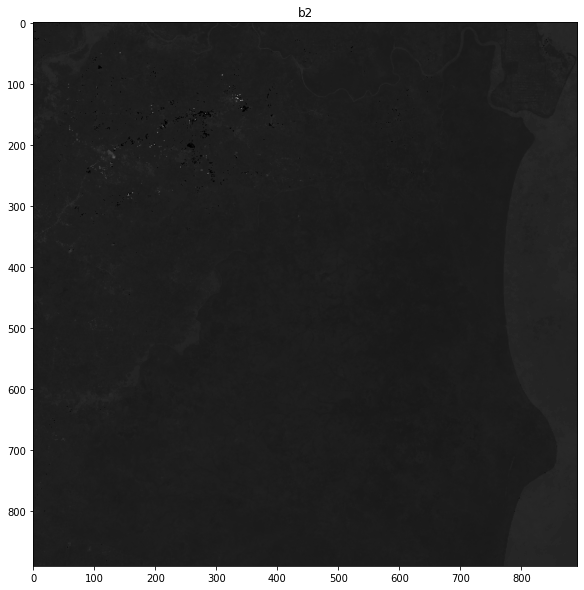

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


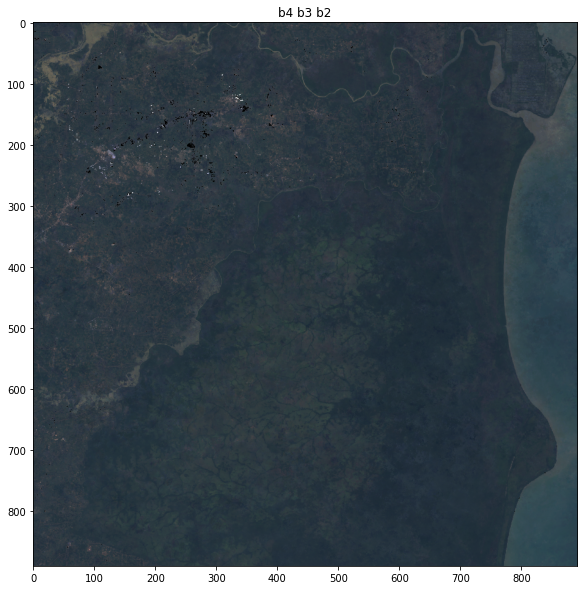

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


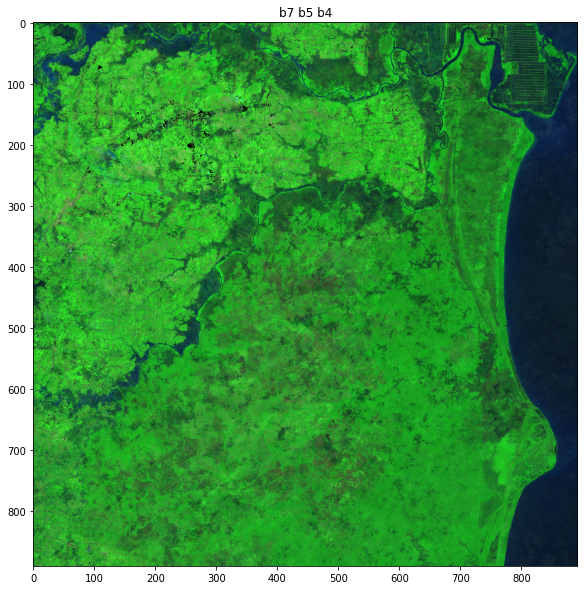

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


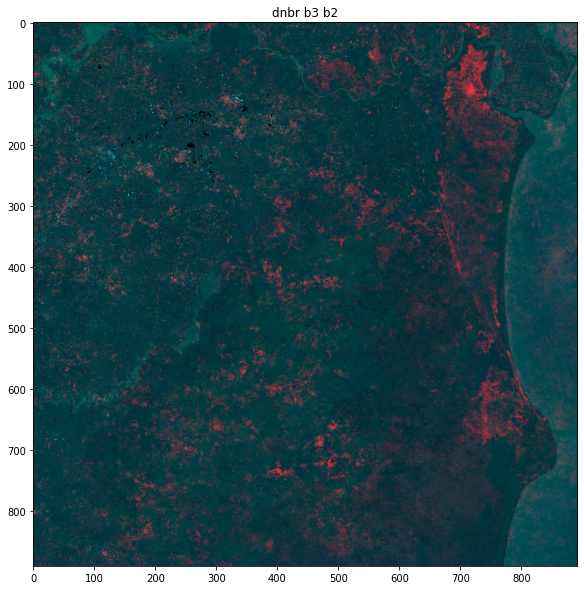

In [27]:
landsat_postfire_dict = {
    'dnbr_b7': 2,
    'b5_b4': 2,
    'b3_b2': 2
}
os.chdir(dp.LANDSAT_8_POSTFIRE_GEOTIFF_FOLDER_PATH)
landsat_postfire_img_band = get_img_as_array(
    os.path.abspath(landsat_metadata['folder_paths_geotiff'][5624]), 
    landsat_postfire_dict,
)

for band, img in landsat_postfire_img_band.items():
    display_image(img, figsize=(100, 10), title=band, cmap="gray")

b4_b3_b2 = np.dstack(
    (
        landsat_postfire_img_band['b4'], 
        landsat_postfire_img_band['b3'], 
        landsat_postfire_img_band['b2'],
    )
)
b7_b5_b4 = np.dstack(
    (
        landsat_postfire_img_band['b7'], 
        landsat_postfire_img_band['b5'], 
        landsat_postfire_img_band['b4'],
    )
)

dnbr_b3_b2 = np.dstack(
    (
        landsat_postfire_img_band['dnbr'],
        landsat_postfire_img_band['b3'],
        landsat_postfire_img_band['b2'],
    )
)

display_image(b4_b3_b2*FACTOR, figsize=(100, 10), title="b4 b3 b2")
display_image(b7_b5_b4*FACTOR, figsize=(100, 10), title="b7 b5 b4")
display_image(dnbr_b3_b2*FACTOR, figsize=(100, 10), title="dnbr b3 b2")

## Plot Mean dNBR (Delta Normalized Burned Ratio) from Landsat-8 Metadata

Determine class of the image based on mean of Delta Normalized Burned Ration of each image

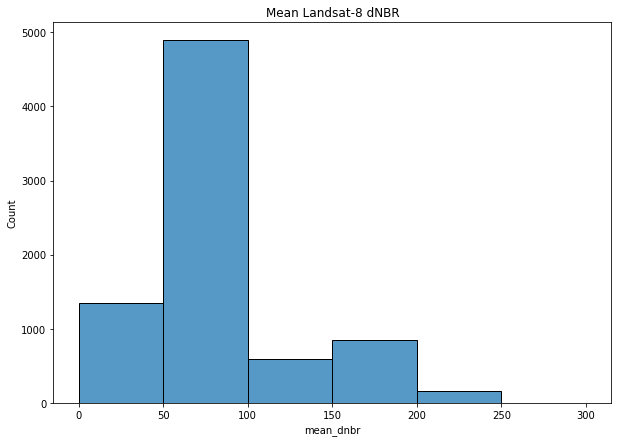

In [29]:
bins = [i*1000 for i in np.arange(0,0.35,0.05)]

plt.figure(figsize=(10,7))
plt.title("Mean Landsat-8 dNBR")
sns.histplot(landsat_metadata['mean_dnbr']*1000, bins=bins)
plt.show()

Based on the histogram plot above, we will determine class as based on this terms:
1. if mean below <= 0.05 class 0
2. if mean below <= 0.1 class 1
3. if mean below 0.1 <  class 2

In [30]:
# if mean below <= 0.05 class 0
# if mean below <= 0.1 class 1
# if mean below 0.1 <  class 2
burn_severity_class = []

for mean_dnbr in landsat_metadata['mean_dnbr']:
    if mean_dnbr <= 0.05:
        burn_severity_class.append(0)
    elif mean_dnbr <= 0.1:
        burn_severity_class.append(1)
    else:
        burn_severity_class .append(2)

In [31]:
landsat_metadata['class'] = burn_severity_class
landsat_metadata.head()

,folder_paths_geotiff,mean_dnbr,median_dnbr,image_condition,file_paths_jpeg,class
0,D:\wildfire-sumatera-dataset\wildfire-sumatera...,0.050867,0.028118,1,D:\wildfire-sumatera-dataset\wildfire-sumatera...,1
1,D:\wildfire-sumatera-dataset\wildfire-sumatera...,0.050547,0.027762,1,D:\wildfire-sumatera-dataset\wildfire-sumatera...,1
2,D:\wildfire-sumatera-dataset\wildfire-sumatera...,0.054626,0.029420,1,D:\wildfire-sumatera-dataset\wildfire-sumatera...,1
3,D:\wildfire-sumatera-dataset\wildfire-sumatera...,0.027477,0.017275,1,D:\wildfire-sumatera-dataset\wildfire-sumatera...,0
4,D:\wildfire-sumatera-dataset\wildfire-sumatera...,0.050742,0.028028,1,D:\wildfire-sumatera-dataset\wildfire-sumatera...,1


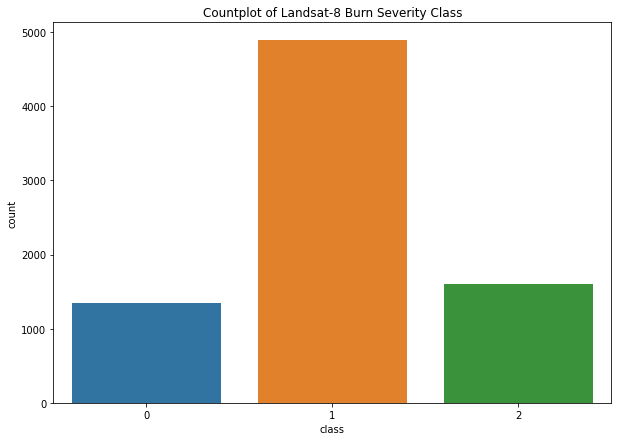

In [32]:
plt.figure(figsize=(10,7))
plt.title("Countplot of Landsat-8 Burn Severity Class")
sns.countplot(x='class', data=landsat_metadata)
plt.show()

## Export to .csv file

In [33]:
landsat_metadata.to_csv(dp.METADATA_LANDSAT_8_FILE_PATH, index=False)

## Plot Median dNBR

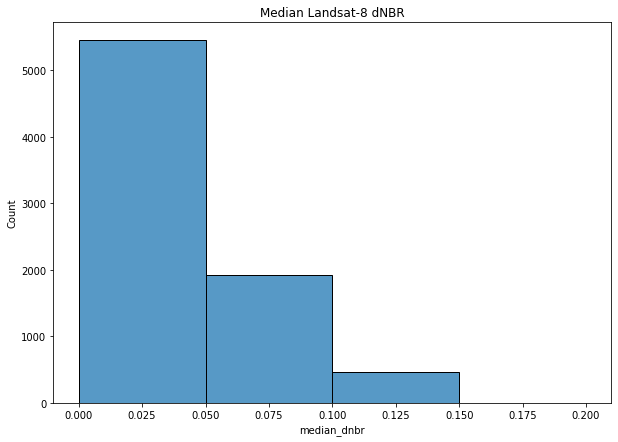

In [35]:
bins = [i for i in np.arange(0,0.25,0.05)]

plt.figure(figsize=(10,7))
plt.title("Median Landsat-8 dNBR")
sns.histplot(landsat_metadata['median_dnbr'], bins=bins)
plt.show()

## Convert to .jpeg file
The steps for this code involve:
1. Looping through all the GeoTIFF file paths from the **landsat_metadata** (D:\\wildfire-sumatera-dataset\\metadata_landsat_8.csv)
2. Create a new file name with its extension which is *.jpeg*.'
3. Get the GeoTIFFs file from the file path, get the image in form of an array using ***get_img_as_array*** function and then convert to *.jpeg* using ***convert_to_jpeg*** function.
4. If the process is succesful then append image condition as 1 (success) to an array. Otherwise, set it to 0 (fail) so that it wont be used.
5. If the file already exist just append the image condition as 1 (success) to an array.

In [39]:
image_condition = []
file_paths_jpeg = []
ext = ".jpeg"
# Looping through the GeoTIFF file paths from the landsat_metadata
for folder in landsat_metadata['folder_paths_geotiff']:
    # create a nre file name with its extension
    file_path = dp.LANDSAT_8_JPEG_FOLDER_PATH + "\\" + folder.split('\\')[-1] + ext
    file_paths_jpeg.append(file_path)
    # if the .jpeg file doesn't exist create the file 
    if not os.path.exists(file_path):
        try:
            # get image bands as an array 
            landsat_postfire_img_band = get_img_as_array(folder, landsat_postfire_dict)
            # convert to .jpeg
            result = convert_to_jpeg(
                bands = [
                    landsat_postfire_img_band['b2'],
                    landsat_postfire_img_band['b3'],
                    landsat_postfire_img_band['dnbr'], 
                ],
                file_path = file_path,
                )
            # if the result is a success append 1 to the image condition
            if result:
                image_condition.append(1)
        
        # if the process was unsuccessful just append the image condition to 0 so that it won't be used
        except:
            print(sys.exc_info()[0], "occurred.")
            image_condition.append(0)
            
    # if the .jpeg file already exists just append the image condition to one
    else:
        image_condition.append(1)
        print("{} already exist".format(file_path))

D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\0.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\1.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\2.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\3.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\4.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\5.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\6.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\7.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\8.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\9.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\10.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\11.jpeg already exist
D:

D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\239.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\240.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\241.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\242.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\243.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\244.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\245.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\246.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\247.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\248.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\249.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\250

D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\487.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\488.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\489.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\490.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\491.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\492.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\493.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\494.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\495.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\496.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\497.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\498

D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\720.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\721.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\722.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\723.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\724.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\725.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\726.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\727.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\728.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\729.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\730.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\731

D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\920.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\921.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\922.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\923.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\924.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\925.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\926.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\927.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\928.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\929.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\930.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\931

D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\1101.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\1102.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\1103.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\1104.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\1105.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\1106.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\1107.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\1108.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\1109.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\1110.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\1111.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\la

D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\1276.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\1277.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\1278.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\1279.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\1280.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\1281.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\1282.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\1283.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\1284.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\1285.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\1286.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\la

D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\1470.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\1471.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\1472.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\1473.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\1474.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\1475.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\1476.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\1477.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\1478.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\1479.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\1480.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\la

D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\1650.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\1651.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\1652.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\1653.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\1654.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\1655.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\1656.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\1657.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\1658.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\1659.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\1660.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\la

D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\1831.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\1832.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\1833.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\1834.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\1835.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\1836.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\1837.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\1838.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\1839.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\1840.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\1841.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\la

D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\2002.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\2003.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\2004.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\2005.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\2006.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\2007.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\2008.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\2009.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\2010.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\2011.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\2012.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\la

D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\2174.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\2175.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\2176.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\2177.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\2178.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\2179.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\2180.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\2181.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\2182.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\2183.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\2184.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\la

D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\2353.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\2354.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\2355.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\2356.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\2357.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\2358.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\2359.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\2360.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\2361.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\2362.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\2363.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\la

D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\2520.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\2521.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\2522.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\2523.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\2524.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\2525.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\2526.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\2527.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\2528.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\2529.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\2530.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\la

D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\2685.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\2686.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\2687.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\2688.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\2689.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\2690.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\2691.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\2692.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\2693.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\2694.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\2695.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\la

D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\2841.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\2842.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\2843.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\2844.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\2845.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\2846.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\2847.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\2848.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\2849.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\2850.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\2851.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\la

D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\2999.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\3000.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\3001.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\3002.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\3003.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\3004.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\3005.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\3006.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\3007.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\3008.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\3009.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\la

D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\3917.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\3918.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\3919.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\3920.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\3921.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\3922.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\3923.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\3924.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\3925.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\3926.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\3927.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\la

D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\4715.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\4716.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\4717.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\4718.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\4719.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\4720.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\4721.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\4722.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\4723.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\4724.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\4725.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\la

D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\5260.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\5261.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\5262.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\5263.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\5264.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\5265.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\5266.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\5267.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\5268.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\5269.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\5270.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\la

<class 'cv2.error'> occurred.
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\5624.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\5625.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\5626.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\5627.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\5628.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\5629.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\5630.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\5631.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\5632.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\5633.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\5634.jpeg already exist
D:\wildfire-sumatera-dat

D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\5897.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\5898.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\5899.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\5900.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\5901.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\5902.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\5903.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\5904.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\5905.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\5906.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\5907.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\la

D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\6274.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\6275.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\6276.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\6277.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\6278.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\6279.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\6280.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\6281.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\6282.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\6283.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\6284.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\la

D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\6535.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\6536.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\6537.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\6538.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\6539.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\6540.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\6541.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\6542.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\6543.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\6544.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\6545.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\la

D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\6852.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\6853.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\6854.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\6855.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\6856.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\6857.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\6858.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\6859.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\6860.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\6861.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\6862.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\la

D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\7129.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\7130.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\7131.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\7132.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\7133.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\7134.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\7135.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\7136.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\7137.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\7138.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\7139.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\la

D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\7392.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\7393.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\7394.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\7395.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\7396.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\7397.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\7398.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\7399.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\7400.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\7401.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\7402.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\la

D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\7638.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\7639.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\7640.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\7641.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\7642.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\7643.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\7644.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\7645.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\7646.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\7647.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\landsat-8\7648.jpeg already exist
D:\wildfire-sumatera-dataset\wildfire-sumatera-jpeg\la

In [40]:
landsat_metadata['image_condition'] = image_condition
landsat_metadata['file_paths_jpeg'] = file_paths_jpeg 

landsat_metadata.to_csv(dp.METADATA_LANDSAT_8_FILE_PATH, index=False)

# 4. Creating Dataframe (Metadata) for Sentinel Images
Include:
1. folder_paths = use to store all folder paths
2. class = use to determine the label of the image
3. mean_dnbr = stores mean of pixels in delta normalized burned ratio. 
4. median_dnbr = stores median of pixels in delta normalized burned ratio.

In [50]:
# getting list of folder paths
sentinel_dictionary = {
    'folder_paths_geotiff' : [],
    'class' : [],
    'mean_dnbr' : [],
    'median_dnbr' : [],
}

sentinel_postfire_dict = {
    'dnbr_b12': 2,
    'b8_b4': 2,
    'b3_b2': 2
}

sentinel_dictionary['folder_paths'] = os.listdir(dp.SENTINEL_2_POSTFIRE_GEOTIFF_FOLDER_PATH)
# sort using key = int to convert data to int first before sorting
sentinel_dictionary['folder_paths'].sort(key=int)

# adding a folder path of its parent 
sentinel_dictionary['folder_paths'] = [dp.SENTINEL_2_POSTFIRE_GEOTIFF_FOLDER_PATH + "\\" + folder_name 
                                      for folder_name in sentinel_dictionary['folder_paths']] 
sentinel_dictionary

{'folder_paths_geotiff': [],
 'class': [],
 'mean_dnbr': [],
 'median_dnbr': [],
 'folder_paths': ['D:\\wildfire-sumatera-dataset\\wildfire-sumatera-geotiff\\sentinel-2\\postfire\\0',
  'D:\\wildfire-sumatera-dataset\\wildfire-sumatera-geotiff\\sentinel-2\\postfire\\1',
  'D:\\wildfire-sumatera-dataset\\wildfire-sumatera-geotiff\\sentinel-2\\postfire\\2',
  'D:\\wildfire-sumatera-dataset\\wildfire-sumatera-geotiff\\sentinel-2\\postfire\\3',
  'D:\\wildfire-sumatera-dataset\\wildfire-sumatera-geotiff\\sentinel-2\\postfire\\4',
  'D:\\wildfire-sumatera-dataset\\wildfire-sumatera-geotiff\\sentinel-2\\postfire\\5',
  'D:\\wildfire-sumatera-dataset\\wildfire-sumatera-geotiff\\sentinel-2\\postfire\\6',
  'D:\\wildfire-sumatera-dataset\\wildfire-sumatera-geotiff\\sentinel-2\\postfire\\7',
  'D:\\wildfire-sumatera-dataset\\wildfire-sumatera-geotiff\\sentinel-2\\postfire\\8',
  'D:\\wildfire-sumatera-dataset\\wildfire-sumatera-geotiff\\sentinel-2\\postfire\\9',
  'D:\\wildfire-sumatera-dataset\

In [68]:
# getting statistics median, mean
sentinel_dictionary['mean_dnbr'] = []
sentinel_dictionary['median_dnbr'] = []

for folder in sentinel_dictionary['folder_paths']:
    img_band = get_img_as_array(folder, sentinel_postfire_dict)
    
    # find mean of dnbr only value above 0
    try:
        temp = img_band['dnbr']
        temp = np.where(temp>0, temp, np.nan)
        sentinel_dictionary['mean_dnbr'].append(np.nanmean(temp))
        sentinel_dictionary['median_dnbr'].append(np.nanmedian(temp))
        print(len(sentinel_dictionary['mean_dnbr']))
        print(len(sentinel_dictionary['median_dnbr']))
    except:
        sentinel_dictionary['mean_dnbr'].append(np.nan)
        sentinel_dictionary['median_dnbr'].append(np.nan)
        print("there's some error occured")

D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\0
1
1
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\1
2
2
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\2
3
3
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\3
4
4
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\4
5
5
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\5
6
6
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\6
7
7
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\7
8
8
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\8
9
9
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\9
10
10
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\10
11
11
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\11
12
12
D:\wildfire-sumatera

100
100
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\100
101
101
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\101
102
102
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\102
103
103
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\103
104
104
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\104
105
105
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\105
106
106
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\106
107
107
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\107
108
108
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\108
109
109
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\109
110
110
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\110
111
111
D:\wildfire-sumatera-dataset\wildfi

196
196
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\196
197
197
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\197
198
198
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\198
199
199
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\199
200
200
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\200
201
201
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\201
202
202
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\202
203
203
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\203
204
204
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\204
205
205
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\205
206
206
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\206
207
207
D:\wildfire-sumatera-dataset\wildfi

292
292
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\292
293
293
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\293
294
294
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\294
295
295
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\295
296
296
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\296
297
297
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\297
298
298
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\298
299
299
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\299
300
300
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\300
301
301
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\301
302
302
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\302
303
303
D:\wildfire-sumatera-dataset\wildfi

387
387
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\387
388
388
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\388
389
389
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\389
390
390
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\390
391
391
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\391
392
392
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\392
393
393
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\393
394
394
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\394
395
395
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\395
396
396
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\396
397
397
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\397
398
398
D:\wildfire-sumatera-dataset\wildfi

483
483
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\483
484
484
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\484
485
485
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\485
486
486
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\486
487
487
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\487
488
488
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\488
489
489
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\489
490
490
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\490
491
491
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\491
492
492
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\492
493
493
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\493
494
494
D:\wildfire-sumatera-dataset\wildfi

579
579
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\579
580
580
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\580
581
581
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\581
582
582
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\582
583
583
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\583
584
584
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\584
585
585
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\585
586
586
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\586
587
587
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\587
588
588
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\588
589
589
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\589
590
590
D:\wildfire-sumatera-dataset\wildfi

675
675
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\675
676
676
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\676
677
677
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\677
678
678
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\678
679
679
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\679
680
680
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\680
681
681
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\681
682
682
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\682
683
683
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\683
684
684
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\684
685
685
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\685
686
686
D:\wildfire-sumatera-dataset\wildfi

772
772
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\772
773
773
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\773
774
774
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\774
775
775
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\775
776
776
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\776
777
777
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\777
778
778
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\778
779
779
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\779
780
780
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\780
781
781
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\781
782
782
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\782
783
783
D:\wildfire-sumatera-dataset\wildfi

868
868
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\868
869
869
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\869
870
870
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\870
871
871
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\871
872
872
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\872
873
873
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\873
874
874
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\874
875
875
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\875
876
876
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\876
877
877
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\877
878
878
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\878
879
879
D:\wildfire-sumatera-dataset\wildfi

964
964
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\964
965
965
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\965
966
966
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\966
967
967
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\967
968
968
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\968
969
969
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\969
970
970
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\970
971
971
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\971
972
972
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\972
973
973
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\973
974
974
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\974
975
975
D:\wildfire-sumatera-dataset\wildfi

1057
1057
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\1057
1058
1058
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\1058
1059
1059
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\1059
1060
1060
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\1060
1061
1061
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\1061
1062
1062
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\1062
1063
1063
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\1063
1064
1064
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\1064
1065
1065
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\1065
1066
1066
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\1066
1067
1067
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\1067
1068
1068


1150
1150
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\1150
1151
1151
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\1151
1152
1152
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\1152
1153
1153
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\1153
1154
1154
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\1154
1155
1155
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\1155
1156
1156
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\1156
1157
1157
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\1157
1158
1158
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\1158
1159
1159
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\1159
1160
1160
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\1160
1161
1161


1243
1243
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\1243
1244
1244
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\1244
1245
1245
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\1245
1246
1246
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\1246
1247
1247
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\1247
1248
1248
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\1248
1249
1249
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\1249
1250
1250
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\1250
1251
1251
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\1251
1252
1252
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\1252
1253
1253
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\1253
1254
1254


1336
1336
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\1336
1337
1337
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\1337
1338
1338
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\1338
1339
1339
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\1339
1340
1340
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\1340
1341
1341
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\1341
1342
1342
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\1342
1343
1343
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\1343
1344
1344
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\1344
1345
1345
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\1345
1346
1346
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\1346
1347
1347


1429
1429
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\1429
1430
1430
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\1430
1431
1431
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\1431
1432
1432
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\1432
1433
1433
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\1433
1434
1434
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\1434
1435
1435
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\1435
1436
1436
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\1436
1437
1437
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\1437
1438
1438
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\1438
1439
1439
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\1439
1440
1440


1522
1522
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\1522
1523
1523
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\1523
1524
1524
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\1524
1525
1525
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\1525
1526
1526
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\1526
1527
1527
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\1527
1528
1528
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\1528
1529
1529
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\1529
1530
1530
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\1530
1531
1531
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\1531
1532
1532
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\1532
1533
1533


1615
1615
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\1615
1616
1616
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\1616
1617
1617
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\1617
1618
1618
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\1618
1619
1619
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\1619
1620
1620
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\1620
1621
1621
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\1621
1622
1622
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\1622
1623
1623
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\1623
1624
1624
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\1624
1625
1625
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\1625
1626
1626


1708
1708
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\1708
1709
1709
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\1709
1710
1710
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\1710
1711
1711
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\1711
1712
1712
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\1712
1713
1713
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\1713
1714
1714
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\1714
1715
1715
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\1715
1716
1716
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\1716
1717
1717
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\1717
1718
1718
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\1718
1719
1719


1801
1801
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\1801
1802
1802
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\1802
1803
1803
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\1803
1804
1804
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\1804
1805
1805
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\1805
1806
1806
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\1806
1807
1807
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\1807
1808
1808
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\1808
1809
1809
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\1809
1810
1810
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\1810
1811
1811
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\1811
1812
1812


1894
1894
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\1894
1895
1895
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\1895
1896
1896
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\1896
1897
1897
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\1897
1898
1898
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\1898
1899
1899
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\1899
1900
1900
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\1900
1901
1901
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\1901
1902
1902
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\1902
1903
1903
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\1903
1904
1904
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\1904
1905
1905


1986
1986
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\1986
1987
1987
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\1987
1988
1988
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\1988
1989
1989
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\1989
1990
1990
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\1990
1991
1991
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\1991
1992
1992
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\1992
1993
1993
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\1993
1994
1994
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\1994
1995
1995
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\1995
1996
1996
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\1996
1997
1997


2078
2078
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\2078
2079
2079
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\2079
2080
2080
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\2080
2081
2081
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\2081
2082
2082
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\2082
2083
2083
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\2083
2084
2084
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\2084
2085
2085
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\2085
2086
2086
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\2086
2087
2087
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\2087
2088
2088
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\2088
2089
2089


2172
2172
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\2172
2173
2173
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\2173
2174
2174
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\2174
2175
2175
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\2175
2176
2176
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\2176
2177
2177
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\2177
2178
2178
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\2178
2179
2179
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\2179
2180
2180
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\2180
2181
2181
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\2181
2182
2182
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\2182
2183
2183


2265
2265
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\2265
2266
2266
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\2266
2267
2267
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\2267
2268
2268
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\2268
2269
2269
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\2269
2270
2270
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\2270
2271
2271
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\2271
2272
2272
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\2272
2273
2273
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\2273
2274
2274
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\2274
2275
2275
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\2275
2276
2276


2358
2358
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\2358
2359
2359
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\2359
2360
2360
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\2360
2361
2361
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\2361
2362
2362
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\2362
2363
2363
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\2363
2364
2364
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\2364
2365
2365
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\2365
2366
2366
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\2366
2367
2367
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\2367
2368
2368
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\2368
2369
2369


2450
2450
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\2450
2451
2451
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\2451
2452
2452
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\2452
2453
2453
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\2453
2454
2454
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\2454
2455
2455
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\2455
2456
2456
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\2456
2457
2457
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\2457
2458
2458
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\2458
2459
2459
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\2459
2460
2460
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\2460
2461
2461


2542
2542
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\2542
2543
2543
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\2543
2544
2544
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\2544
2545
2545
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\2545
2546
2546
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\2546
2547
2547
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\2547
2548
2548
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\2548
2549
2549
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\2549
2550
2550
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\2550
2551
2551
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\2551
2552
2552
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\2552
2553
2553


2634
2634
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\2634
2635
2635
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\2635
2636
2636
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\2636
2637
2637
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\2637
2638
2638
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\2638
2639
2639
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\2639
2640
2640
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\2640
2641
2641
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\2641
2642
2642
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\2642
2643
2643
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\2643
2644
2644
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\2644
2645
2645


2727
2727
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\2727
2728
2728
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\2728
2729
2729
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\2729
2730
2730
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\2730
2731
2731
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\2731
2732
2732
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\2732
2733
2733
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\2733
2734
2734
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\2734
2735
2735
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\2735
2736
2736
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\2736
2737
2737
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\2737
2738
2738


2820
2820
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\2820
2821
2821
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\2821
2822
2822
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\2822
2823
2823
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\2823
2824
2824
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\2824
2825
2825
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\2825
2826
2826
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\2826
2827
2827
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\2827
2828
2828
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\2828
2829
2829
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\2829
2830
2830
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\2830
2831
2831


2912
2912
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\2912
2913
2913
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\2913
2914
2914
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\2914
2915
2915
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\2915
2916
2916
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\2916
2917
2917
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\2917
2918
2918
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\2918
2919
2919
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\2919
2920
2920
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\2920
2921
2921
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\2921
2922
2922
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\2922
2923
2923


3005
3005
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\3005
3006
3006
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\3006
3007
3007
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\3007
3008
3008
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\3008
3009
3009
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\3009
3010
3010
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\3010
3011
3011
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\3011
3012
3012
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\3012
3013
3013
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\3013
3014
3014
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\3014
3015
3015
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\3015
3016
3016


3098
3098
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\3098
3099
3099
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\3099
3100
3100
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\3100
3101
3101
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\3101
3102
3102
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\3102
3103
3103
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\3103
3104
3104
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\3104
3105
3105
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\3105
3106
3106
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\3106
3107
3107
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\3107
3108
3108
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\3108
3109
3109


3191
3191
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\3191
3192
3192
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\3192
3193
3193
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\3193
3194
3194
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\3194
3195
3195
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\3195
3196
3196
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\3196
3197
3197
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\3197
3198
3198
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\3198
3199
3199
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\3199
3200
3200
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\3200
3201
3201
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\3201
3202
3202


3284
3284
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\3284
3285
3285
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\3285
3286
3286
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\3286
3287
3287
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\3287
3288
3288
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\3288
3289
3289
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\3289
3290
3290
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\3290
3291
3291
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\3291
3292
3292
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\3292
3293
3293
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\3293
3294
3294
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\3294
3295
3295


3377
3377
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\3377
3378
3378
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\3378
3379
3379
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\3379
3380
3380
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\3380
3381
3381
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\3381
3382
3382
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\3382
3383
3383
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\3383
3384
3384
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\3384
3385
3385
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\3385
3386
3386
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\3386
3387
3387
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\3387
3388
3388


3470
3470
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\3470
3471
3471
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\3471
3472
3472
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\3472
3473
3473
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\3473
3474
3474
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\3474
3475
3475
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\3475
3476
3476
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\3476
3477
3477
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\3477
3478
3478
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\3478
3479
3479
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\3479
3480
3480
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\3480
3481
3481


3563
3563
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\3563
3564
3564
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\3564
3565
3565
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\3565
3566
3566
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\3566
3567
3567
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\3567
3568
3568
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\3568
3569
3569
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\3569
3570
3570
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\3570
3571
3571
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\3571
3572
3572
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\3572
3573
3573
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\3573
3574
3574


3656
3656
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\3656
3657
3657
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\3657
3658
3658
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\3658
3659
3659
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\3659
3660
3660
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\3660
3661
3661
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\3661
3662
3662
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\3662
3663
3663
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\3663
3664
3664
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\3664
3665
3665
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\3665
3666
3666
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\3666
3667
3667


3750
3750
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\3750
3751
3751
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\3751
3752
3752
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\3752
3753
3753
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\3753
3754
3754
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\3754
3755
3755
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\3755
3756
3756
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\3756
3757
3757
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\3757
3758
3758
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\3758
3759
3759
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\3759
3760
3760
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\3760
3761
3761


3843
3843
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\3843
3844
3844
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\3844
3845
3845
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\3845
3846
3846
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\3846
3847
3847
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\3847
3848
3848
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\3848
3849
3849
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\3849
3850
3850
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\3850
3851
3851
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\3851
3852
3852
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\3852
3853
3853
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\3853
3854
3854


3937
3937
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\3937
3938
3938
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\3938
3939
3939
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\3939
3940
3940
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\3940
3941
3941
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\3941
3942
3942
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\3942
3943
3943
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\3943
3944
3944
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\3944
3945
3945
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\3945
3946
3946
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\3946
3947
3947
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\3947
3948
3948


4030
4030
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\4030
4031
4031
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\4031
4032
4032
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\4032
4033
4033
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\4033
4034
4034
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\4034
4035
4035
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\4035
4036
4036
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\4036
4037
4037
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\4037
4038
4038
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\4038
4039
4039
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\4039
4040
4040
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\4040
4041
4041


4122
4122
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\4122
4123
4123
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\4123
4124
4124
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\4124
4125
4125
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\4125
4126
4126
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\4126
4127
4127
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\4127
4128
4128
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\4128
4129
4129
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\4129
4130
4130
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\4130
4131
4131
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\4131
4132
4132
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\4132
4133
4133


4215
4215
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\4215
4216
4216
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\4216
4217
4217
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\4217
4218
4218
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\4218
4219
4219
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\4219
4220
4220
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\4220
4221
4221
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\4221
4222
4222
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\4222
4223
4223
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\4223
4224
4224
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\4224
4225
4225
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\4225
4226
4226


4307
4307
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\4307
4308
4308
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\4308
4309
4309
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\4309
4310
4310
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\4310
4311
4311
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\4311
4312
4312
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\4312
4313
4313
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\4313
4314
4314
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\4314
4315
4315
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\4315
4316
4316
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\4316
4317
4317
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\4317
4318
4318


4399
4399
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\4399
4400
4400
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\4400
4401
4401
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\4401
4402
4402
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\4402
4403
4403
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\4403
4404
4404
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\4404
4405
4405
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\4405
4406
4406
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\4406
4407
4407
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\4407
4408
4408
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\4408
4409
4409
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\4409
4410
4410


4492
4492
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\4492
4493
4493
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\4493
4494
4494
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\4494
4495
4495
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\4495
4496
4496
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\4496
4497
4497
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\4497
4498
4498
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\4498
4499
4499
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\4499
4500
4500
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\4500
4501
4501
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\4501
4502
4502
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\4502
4503
4503


4584
4584
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\4584
4585
4585
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\4585
4586
4586
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\4586
4587
4587
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\4587
4588
4588
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\4588
4589
4589
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\4589
4590
4590
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\4590
4591
4591
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\4591
4592
4592
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\4592
4593
4593
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\4593
4594
4594
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\4594
4595
4595


4676
4676
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\4676
4677
4677
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\4677
4678
4678
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\4678
4679
4679
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\4679
4680
4680
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\4680
4681
4681
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\4681
4682
4682
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\4682
4683
4683
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\4683
4684
4684
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\4684
4685
4685
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\4685
4686
4686
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\4686
4687
4687


4770
4770
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\4770
4771
4771
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\4771
4772
4772
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\4772
4773
4773
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\4773
4774
4774
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\4774
4775
4775
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\4775
4776
4776
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\4776
there's some error occured
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\4777
4778
4778
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\4778
4779
4779
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\4779
4780
4780
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfir

4862
4862
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\4862
4863
4863
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\4863
4864
4864
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\4864
4865
4865
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\4865
4866
4866
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\4866
4867
4867
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\4867
4868
4868
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\4868
4869
4869
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\4869
4870
4870
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\4870
4871
4871
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\4871
4872
4872
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\4872
4873
4873


4955
4955
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\4955
4956
4956
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\4956
4957
4957
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\4957
4958
4958
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\4958
4959
4959
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\4959
4960
4960
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\4960
4961
4961
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\4961
4962
4962
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\4962
4963
4963
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\4963
4964
4964
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\4964
4965
4965
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\4965
4966
4966


5049
5049
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\5049
5050
5050
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\5050
5051
5051
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\5051
5052
5052
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\5052
5053
5053
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\5053
5054
5054
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\5054
5055
5055
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\5055
5056
5056
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\5056
5057
5057
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\5057
5058
5058
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\5058
5059
5059
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\5059
5060
5060


5142
5142
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\5142
5143
5143
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\5143
5144
5144
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\5144
5145
5145
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\5145
5146
5146
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\5146
5147
5147
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\5147
5148
5148
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\5148
5149
5149
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\5149
5150
5150
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\5150
5151
5151
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\5151
5152
5152
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\5152
5153
5153


5235
5235
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\5235
5236
5236
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\5236
5237
5237
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\5237
5238
5238
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\5238
5239
5239
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\5239
5240
5240
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\5240
5241
5241
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\5241
5242
5242
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\5242
5243
5243
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\5243
5244
5244
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\5244
5245
5245
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\5245
5246
5246


5328
5328
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\5328
5329
5329
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\5329
5330
5330
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\5330
5331
5331
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\5331
5332
5332
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\5332
5333
5333
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\5333
5334
5334
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\5334
5335
5335
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\5335
5336
5336
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\5336
5337
5337
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\5337
5338
5338
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\5338
5339
5339


5422
5422
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\5422
5423
5423
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\5423
5424
5424
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\5424
5425
5425
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\5425
5426
5426
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\5426
5427
5427
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\5427
5428
5428
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\5428
5429
5429
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\5429
5430
5430
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\5430
5431
5431
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\5431
5432
5432
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\5432
5433
5433


5515
5515
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\5515
5516
5516
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\5516
5517
5517
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\5517
5518
5518
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\5518
5519
5519
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\5519
5520
5520
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\5520
5521
5521
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\5521
5522
5522
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\5522
5523
5523
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\5523
5524
5524
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\5524
5525
5525
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\5525
5526
5526


5608
5608
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\5608
5609
5609
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\5609
5610
5610
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\5610
5611
5611
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\5611
5612
5612
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\5612
5613
5613
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\5613
5614
5614
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\5614
5615
5615
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\5615
5616
5616
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\5616
5617
5617
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\5617
5618
5618
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\5618
5619
5619


5702
5702
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\5702
5703
5703
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\5703
5704
5704
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\5704
5705
5705
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\5705
5706
5706
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\5706
5707
5707
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\5707
5708
5708
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\5708
5709
5709
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\5709
5710
5710
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\5710
5711
5711
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\5711
5712
5712
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\5712
5713
5713


5794
5794
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\5794
5795
5795
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\5795
5796
5796
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\5796
5797
5797
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\5797
5798
5798
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\5798
5799
5799
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\5799
5800
5800
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\5800
5801
5801
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\5801
5802
5802
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\5802
5803
5803
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\5803
5804
5804
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\5804
5805
5805


5886
5886
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\5886
5887
5887
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\5887
5888
5888
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\5888
5889
5889
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\5889
5890
5890
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\5890
5891
5891
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\5891
5892
5892
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\5892
5893
5893
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\5893
5894
5894
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\5894
5895
5895
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\5895
5896
5896
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\5896
5897
5897


5980
5980
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\5980
5981
5981
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\5981
5982
5982
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\5982
5983
5983
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\5983
5984
5984
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\5984
5985
5985
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\5985
5986
5986
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\5986
5987
5987
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\5987
5988
5988
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\5988
5989
5989
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\5989
5990
5990
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\5990
5991
5991


6073
6073
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\6073
6074
6074
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\6074
6075
6075
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\6075
6076
6076
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\6076
6077
6077
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\6077
6078
6078
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\6078
6079
6079
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\6079
6080
6080
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\6080
6081
6081
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\6081
6082
6082
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\6082
6083
6083
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\6083
6084
6084


6165
6165
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\6165
6166
6166
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\6166
6167
6167
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\6167
6168
6168
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\6168
6169
6169
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\6169
6170
6170
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\6170
6171
6171
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\6171
6172
6172
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\6172
6173
6173
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\6173
6174
6174
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\6174
6175
6175
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\6175
6176
6176


6257
6257
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\6257
6258
6258
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\6258
6259
6259
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\6259
6260
6260
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\6260
6261
6261
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\6261
6262
6262
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\6262
6263
6263
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\6263
6264
6264
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\6264
6265
6265
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\6265
6266
6266
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\6266
6267
6267
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\6267
6268
6268


6351
6351
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\6351
6352
6352
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\6352
6353
6353
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\6353
6354
6354
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\6354
6355
6355
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\6355
6356
6356
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\6356
6357
6357
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\6357
6358
6358
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\6358
6359
6359
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\6359
6360
6360
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\6360
6361
6361
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\6361
6362
6362


6443
6443
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\6443
6444
6444
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\6444
6445
6445
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\6445
6446
6446
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\6446
6447
6447
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\6447
6448
6448
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\6448
6449
6449
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\6449
6450
6450
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\6450
6451
6451
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\6451
6452
6452
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\6452
6453
6453
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\6453
6454
6454


6536
6536
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\6536
6537
6537
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\6537
6538
6538
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\6538
6539
6539
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\6539
6540
6540
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\6540
6541
6541
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\6541
6542
6542
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\6542
6543
6543
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\6543
6544
6544
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\6544
6545
6545
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\6545
6546
6546
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\6546
6547
6547


6628
6628
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\6628
6629
6629
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\6629
6630
6630
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\6630
6631
6631
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\6631
6632
6632
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\6632
6633
6633
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\6633
6634
6634
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\6634
6635
6635
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\6635
6636
6636
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\6636
6637
6637
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\6637
6638
6638
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\6638
6639
6639


6721
6721
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\6721
6722
6722
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\6722
6723
6723
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\6723
6724
6724
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\6724
6725
6725
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\6725
6726
6726
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\6726
6727
6727
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\6727
6728
6728
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\6728
6729
6729
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\6729
6730
6730
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\6730
6731
6731
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\6731
6732
6732


6814
6814
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\6814
6815
6815
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\6815
6816
6816
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\6816
6817
6817
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\6817
6818
6818
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\6818
6819
6819
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\6819
6820
6820
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\6820
6821
6821
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\6821
6822
6822
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\6822
6823
6823
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\6823
6824
6824
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\6824
6825
6825


6907
6907
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\6907
6908
6908
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\6908
6909
6909
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\6909
6910
6910
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\6910
6911
6911
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\6911
6912
6912
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\6912
6913
6913
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\6913
6914
6914
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\6914
6915
6915
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\6915
6916
6916
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\6916
6917
6917
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\6917
6918
6918


7000
7000
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\7000
7001
7001
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\7001
7002
7002
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\7002
7003
7003
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\7003
7004
7004
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\7004
7005
7005
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\7005
7006
7006
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\7006
7007
7007
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\7007
7008
7008
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\7008
7009
7009
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\7009
7010
7010
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\7010
7011
7011


7093
7093
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\7093
7094
7094
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\7094
7095
7095
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\7095
7096
7096
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\7096
7097
7097
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\7097
7098
7098
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\7098
7099
7099
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\7099
7100
7100
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\7100
7101
7101
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\7101
7102
7102
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\7102
7103
7103
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\7103
7104
7104


7186
7186
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\7186
7187
7187
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\7187
7188
7188
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\7188
7189
7189
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\7189
7190
7190
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\7190
7191
7191
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\7191
7192
7192
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\7192
7193
7193
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\7193
7194
7194
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\7194
7195
7195
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\7195
7196
7196
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\7196
7197
7197


7279
7279
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\7279
7280
7280
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\7280
7281
7281
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\7281
7282
7282
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\7282
7283
7283
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\7283
7284
7284
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\7284
7285
7285
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\7285
7286
7286
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\7286
7287
7287
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\7287
7288
7288
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\7288
7289
7289
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\7289
7290
7290


7372
7372
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\7372
7373
7373
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\7373
7374
7374
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\7374
7375
7375
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\7375
7376
7376
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\7376
7377
7377
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\7377
7378
7378
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\7378
7379
7379
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\7379
7380
7380
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\7380
7381
7381
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\7381
7382
7382
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\7382
7383
7383


7466
7466
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\7466
7467
7467
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\7467
7468
7468
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\7468
7469
7469
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\7469
7470
7470
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\7470
7471
7471
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\7471
7472
7472
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\7472
7473
7473
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\7473
7474
7474
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\7474
7475
7475
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\7475
7476
7476
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\7476
7477
7477


7559
7559
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\7559
7560
7560
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\7560
7561
7561
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\7561
7562
7562
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\7562
7563
7563
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\7563
7564
7564
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\7564
7565
7565
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\7565
7566
7566
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\7566
7567
7567
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\7567
7568
7568
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\7568
7569
7569
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\7569
7570
7570


7651
7651
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\7651
7652
7652
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\7652
7653
7653
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\7653
7654
7654
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\7654
7655
7655
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\7655
7656
7656
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\7656
7657
7657
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\7657
7658
7658
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\7658
7659
7659
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\7659
7660
7660
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\7660
7661
7661
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\7661
7662
7662


7745
7745
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\7745
7746
7746
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\7746
7747
7747
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\7747
7748
7748
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\7748
7749
7749
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\7749
7750
7750
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\7750
7751
7751
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\7751
7752
7752
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\7752
7753
7753
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\7753
7754
7754
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\7754
7755
7755
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\7755
7756
7756


7837
7837
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\7837
7838
7838
D:\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\7838
7839
7839


In [69]:
sentinel_dictionary

{'folder_paths_geotiff': [],
 'class': [],
 'mean_dnbr': [0.069219515,
  0.068914756,
  0.06832683,
  0.05878151,
  0.06939452,
  0.10341321,
  0.11008595,
  0.10132347,
  0.101984315,
  0.10050103,
  0.10391753,
  0.10643184,
  0.087382756,
  0.103395075,
  0.1100606,
  0.107164405,
  0.10646739,
  0.106426276,
  0.11796728,
  0.106827155,
  0.123184666,
  0.114711836,
  0.05762695,
  0.10752322,
  0.070877366,
  0.081707835,
  0.112827264,
  0.1117743,
  0.08057845,
  0.1457366,
  0.10716677,
  0.14416973,
  0.10738759,
  0.06385674,
  0.12985599,
  0.11358399,
  0.13165063,
  0.054180242,
  0.081282,
  0.11710168,
  0.06522463,
  0.053686995,
  0.12631492,
  0.12622474,
  0.07146862,
  0.053543143,
  0.10633381,
  0.10944975,
  0.084543556,
  0.08714203,
  0.111486636,
  0.10595257,
  0.08514748,
  0.108104736,
  0.08357608,
  0.08220322,
  0.10236459,
  0.098014854,
  0.07528776,
  0.095077366,
  0.09503895,
  0.069512844,
  0.07258703,
  0.12483152,
  0.10822334,
  0.054294534,
  

## Export to .csv
Export to .csv immediately because the time it took to compute mean and median nbr is quite long. 

In [70]:
# convert to pandas DataFrame and export as .csv file
sentinel_df = pd.DataFrame(sentinel_dictionary)
# sentinel_df.to_csv(dp.METADATA_SENTINEL_2_FILE_PATH, index=False)

ValueError: All arrays must be of the same length

# 5. Take a Look at Sentinel Images

## Sentinel Postfire

D:\\wildfire-sumatera-dataset\wildfire-sumatera-geotiff\sentinel-2\postfire\5623


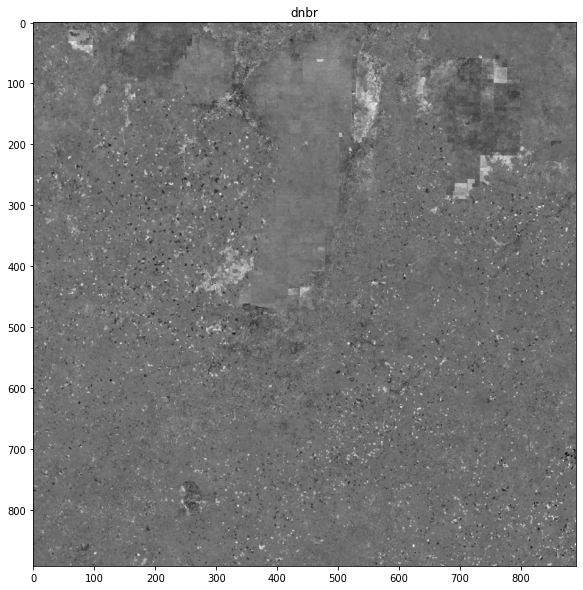

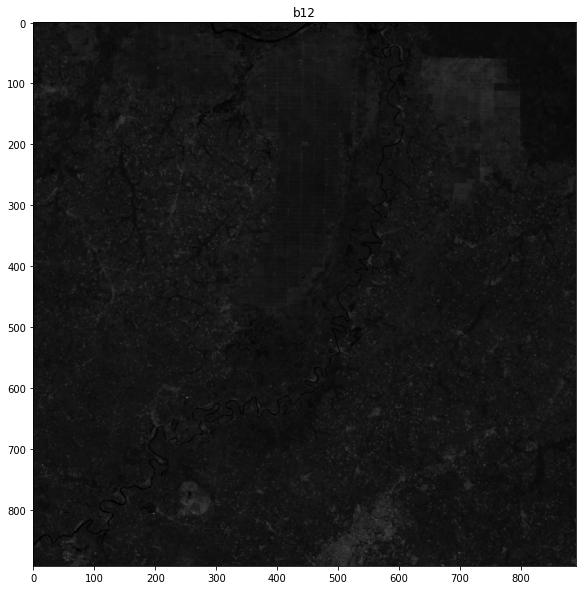

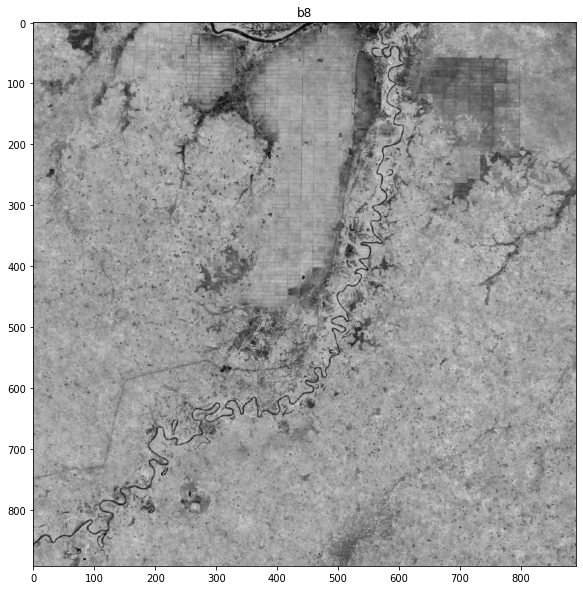

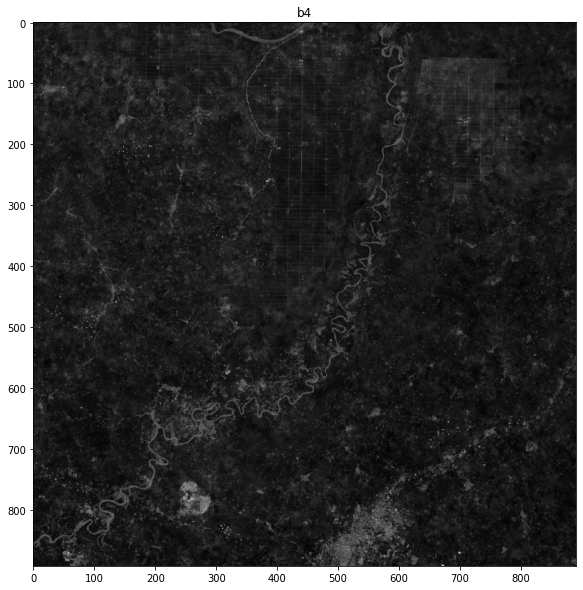

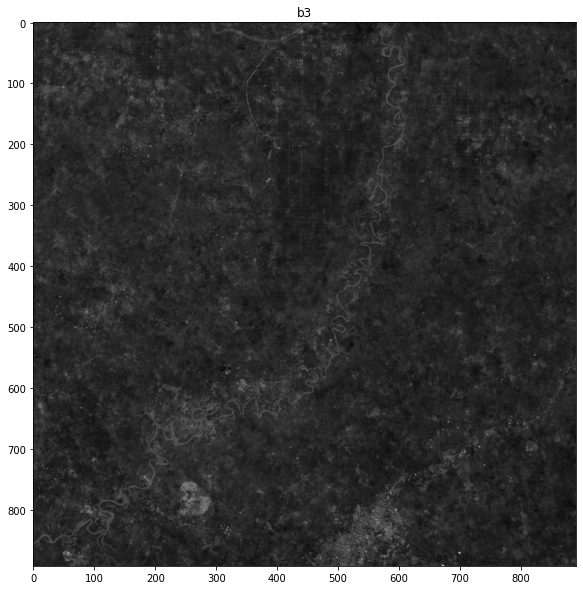

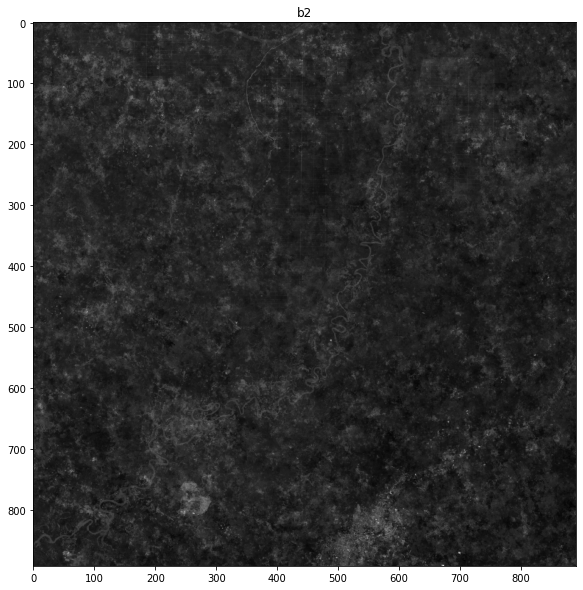

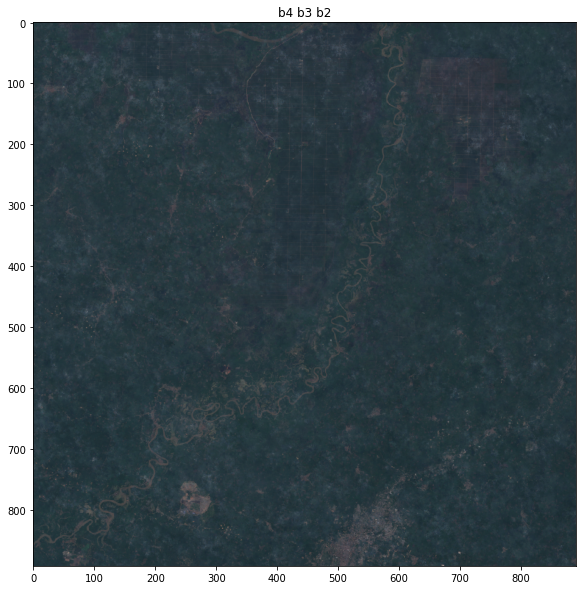

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


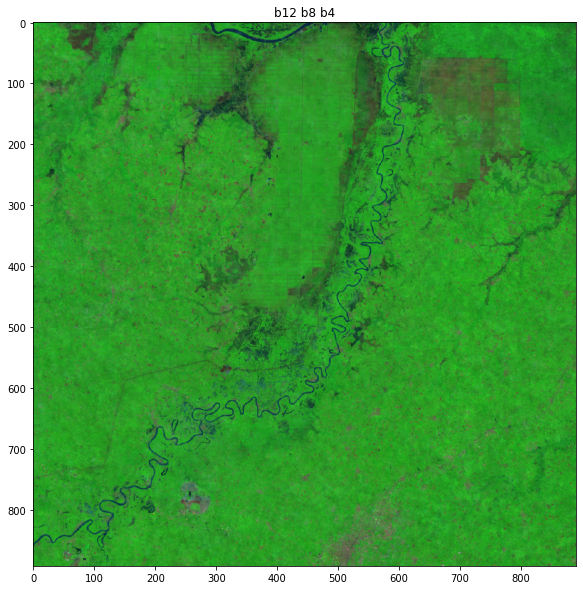

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


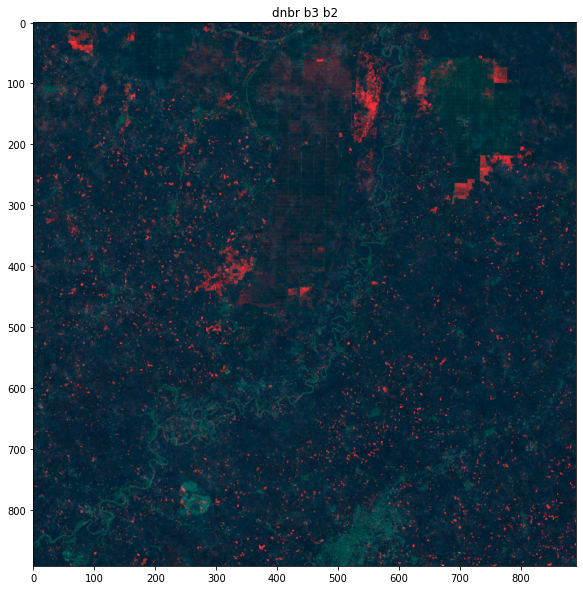

In [47]:
sentinel_metadata = pd.read_csv(dp.METADATA_SENTINEL_2_FILE_PATH)
# sentinel_medadata_copy = sentinel_metadata.copy()
# landsat_prefire_metadata = landsat_medadata_copy.loc[landsat_metadata['class'] == 0].reset_index(drop=True)
# sentinel_postfire_metadata = sentinel_medadata_copy.loc[sentinel_metadata['class'] == 1].reset_index(drop=True)
# sentinel_postfire_metadata.file[0]
sentinel_postfire_dict = {
    'dnbr_b12': 2,
    'b8_b4': 2,
    'b3_b2': 2
}
sentinel_postfire_img_band = get_img_as_array(sentinel_postfire_metadata['file'][5623], sentinel_postfire_dict)

for band, img in sentinel_postfire_img_band.items():
    display_image(img, figsize=(100, 10), title=band, cmap="gray")

b4_b3_b2 = np.dstack(
    (
        sentinel_postfire_img_band['b4'], 
        sentinel_postfire_img_band['b3'], 
        sentinel_postfire_img_band['b2'],
    )
)
b12_b8_b4 = np.dstack(
    (
        sentinel_postfire_img_band['b12'], 
        sentinel_postfire_img_band['b8'], 
        sentinel_postfire_img_band['b4'],
    )
)

dnbr_b3_b2 = np.dstack(
    (
        sentinel_postfire_img_band['dnbr'],
        sentinel_postfire_img_band['b4'],
        sentinel_postfire_img_band['b3'],
    )
)

display_image(b4_b3_b2*FACTOR, figsize=(100, 10), title="b4 b3 b2")
display_image(b12_b8_b4*FACTOR, figsize=(100, 10), title="b12 b8 b4")
display_image(dnbr_b3_b2*FACTOR, figsize=(100, 10), title="dnbr b3 b2")

In [49]:
sentinel_metadata.head()

,file,class
0,D:\\wildfire-sumatera-dataset\wildfire-sumater...,1
1,D:\\wildfire-sumatera-dataset\wildfire-sumater...,1
2,D:\\wildfire-sumatera-dataset\wildfire-sumater...,1
3,D:\\wildfire-sumatera-dataset\wildfire-sumater...,1
4,D:\\wildfire-sumatera-dataset\wildfire-sumater...,1


## Convert to .jpeg file
The steps for this code involve:
1. Looping through all the GeoTIFF file paths from the **sentinel_metadata** (D:\\wildfire-sumatera-dataset\\metadata_landsat_8.csv)
2. Create a new file name with its extension which is *.jpeg*.'
3. Get the GeoTIFFs file from the file path, get the image in form of an array using ***get_img_as_array*** function and then convert to *.jpeg* using ***convert_to_jpeg*** function.
4. If the process is succesful then append image condition as 1 (success) to an array. Otherwise, set it to 0 (fail) so that it wont be used.
5. If the file already exist just append the image condition as 1 (success) to an array.

In [48]:
image_condition = []
ext = ".jpeg"
for folder in sentinel_metadata['folder_paths']:
    file_path = dp.SENTINEL_2_JPEG_FOLDER_PATH + "\\" + folder.split('\\')[-1] + ext
    if not os.path.exists(file_path):
        try:
            sentinel_postfire_img_band = get_img_as_array(folder, sentinel_postfire_dict)
            result = convert_to_jpeg(
                bands = [
                    sentinel_postfire_img_band['b2'],
                    sentinel_postfire_img_band['b3'],
                    sentinel_postfire_img_band['dnbr'], 
                ],
                file_path = file_path,
                )
            if result:
                image_condition.append(1)
        except:
            print(sys.exc_info()[0], "occurred.")
            image_condition.append(0)
    else:
        image_condition.append(1)
        print("{} already exist".format(file_path))

KeyError: 'folder_paths'